<a href="https://colab.research.google.com/github/IanTirok/Moringa-School-Core/blob/main/Moringa_Data_Science_Core_W4_Independent_Project_2021_07_Ian_Tirok_Python_Notebook_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**1. DEFINING THE HYPOTHESIS**

##1a. Overview



Null hypothesis: There is no difference between the average number of Bluecars taken from stations on Mondays and the average number of Bluecars taken from stations on Fridays

Alternative hypothesis: There is a difference between the average number of Bluecars taken from stations on Mondays and the average number of Bluecars taken from station on Fridays

Keys

$H_{0}$ = Null hypothesis

$H_{1}$ = Alternative hypothesis

$mu_{1}$ = Average number of Bluecars taken from stations on Mondays

$mu_{2}$ = Average number of Bluecars taken from stations on Fridays

$H_{0}$: $mu_{1}$ = $mu_{2}$


$H_{1}$: $mu_{1}$ ≠ $mu_{2}$

##1b. Research Question

What effect does the day of the week have on the usage of blue cars

##1c. Sampling Strategy

###Sampling Plan

###Sampling Method

###Sample Size

# **2. IMPORTING LIBRARIES**




In [1]:
# import pandas

import pandas as pd

# import numpy

import numpy as np

# import datetime

import datetime

# import seaborn

import seaborn as sns

# import matplotlib

import matplotlib.pyplot as plt
%matplotlib notebook

# import pandas profiling

import pandas_profiling

# immport scipy

import scipy.stats as stats

#import math

from math import sqrt

#import ttest
from scipy.stats import ttest_ind

from scipy.stats import t

#import drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **3. LOADING OUR DATASETS**

In [2]:
url = '/content/drive/MyDrive/Core Module 1 WK 4 IP/columns_explanation.xlsx'

columns_explanation = pd.read_excel(url)

columns_explanation

,Column name,explanation
0,Postal code,postal code of the area (in Paris)
1,date,date of the row aggregation
2,n_daily_data_points,number of daily data poinst that were availabl...
3,dayOfWeek,identifier of weekday (0: Monday -> 6: Sunday)
4,day_type,weekday or weekend
5,BlueCars_taken_sum,Number of bluecars taken that date in that area
6,BlueCars_returned_sum,Number of bluecars returned that date in that ...
7,Utilib_taken_sum,Number of Utilib taken that date in that area
8,Utilib_returned_sum,Number of Utilib returned that date in that area
9,Utilib_14_taken_sum,Number of Utilib 1.4 taken that date in that area


In [3]:

url = '/content/drive/MyDrive/Core Module 1 WK 4 IP/autolib_daily_events_postal_code.csv'

df = pd.read_csv(url)

df.sample(7)

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
4523,92100,1/2/2018,1438,1,weekday,284,285,8,8,14,17,8,7
12449,93500,4/20/2018,1417,4,weekday,57,55,2,2,2,2,0,0
3952,91330,2/23/2018,1440,4,weekday,14,10,1,0,0,0,1,1
8386,92360,5/27/2018,1440,6,weekend,1,3,0,0,0,0,0,0
9482,92500,6/3/2018,1440,6,weekend,194,164,6,8,17,18,0,0
13175,94100,2/22/2018,1440,3,weekday,2,3,0,0,2,1,0,0
7292,92290,5/3/2018,1439,3,weekday,10,13,1,1,3,3,0,0


# **4. GETTING MORE INFORMATION ABOUT OUR DATASET**. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16085 entries, 0 to 16084
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Postal code             16085 non-null  int64 
 1   date                    16085 non-null  object
 2   n_daily_data_points     16085 non-null  int64 
 3   dayOfWeek               16085 non-null  int64 
 4   day_type                16085 non-null  object
 5   BlueCars_taken_sum      16085 non-null  int64 
 6   BlueCars_returned_sum   16085 non-null  int64 
 7   Utilib_taken_sum        16085 non-null  int64 
 8   Utilib_returned_sum     16085 non-null  int64 
 9   Utilib_14_taken_sum     16085 non-null  int64 
 10  Utilib_14_returned_sum  16085 non-null  int64 
 11  Slots_freed_sum         16085 non-null  int64 
 12  Slots_taken_sum         16085 non-null  int64 
dtypes: int64(11), object(2)
memory usage: 1.6+ MB


In [5]:
df.shape

(16085, 13)

In [6]:
df.count()

Postal code               16085
date                      16085
n_daily_data_points       16085
dayOfWeek                 16085
day_type                  16085
BlueCars_taken_sum        16085
BlueCars_returned_sum     16085
Utilib_taken_sum          16085
Utilib_returned_sum       16085
Utilib_14_taken_sum       16085
Utilib_14_returned_sum    16085
Slots_freed_sum           16085
Slots_taken_sum           16085
dtype: int64

In [7]:
#finding out how many empty or null values are there in a table
ab = df.shape[0]
bc = ab - df.count() 
bc

Postal code               0
date                      0
n_daily_data_points       0
dayOfWeek                 0
day_type                  0
BlueCars_taken_sum        0
BlueCars_returned_sum     0
Utilib_taken_sum          0
Utilib_returned_sum       0
Utilib_14_taken_sum       0
Utilib_14_returned_sum    0
Slots_freed_sum           0
Slots_taken_sum           0
dtype: int64

In [8]:
#finding out how many duplicate rows are in our dataset

len(df)-len(df.drop_duplicates())

0

In [9]:
#finding out parameters of our dataset
df.describe()

,Postal code,n_daily_data_points,dayOfWeek,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
count,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000
mean,88791.293876,1431.330619,2.969599,125.926951,125.912714,3.698290,3.699099,8.600560,8.599192,22.629033,22.629282
std,7647.342000,33.212050,2.008378,185.426579,185.501535,5.815058,5.824634,12.870098,12.868993,52.120263,52.146030
min,75001.000000,1174.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,91330.000000,1439.000000,1.000000,20.000000,20.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,92340.000000,1440.000000,3.000000,46.000000,46.000000,1.000000,1.000000,3.000000,3.000000,0.000000,0.000000
75%,93400.000000,1440.000000,5.000000,135.000000,135.000000,4.000000,4.000000,10.000000,10.000000,5.000000,5.000000
max,95880.000000,1440.000000,6.000000,1352.000000,1332.000000,54.000000,58.000000,100.000000,101.000000,360.000000,359.000000


In [10]:
#find out unique values in each column
df.nunique()

Postal code               104
date                      156
n_daily_data_points        23
dayOfWeek                   7
day_type                    2
BlueCars_taken_sum        932
BlueCars_returned_sum     929
Utilib_taken_sum           48
Utilib_returned_sum        49
Utilib_14_taken_sum        92
Utilib_14_returned_sum     94
Slots_freed_sum           297
Slots_taken_sum           301
dtype: int64

# **5. RE-DEFINING THE COLLUMNS**

In [11]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df.columns


Index(['postal_code', 'date', 'n_daily_data_points', 'dayofweek', 'day_type',
       'bluecars_taken_sum', 'bluecars_returned_sum', 'utilib_taken_sum',
       'utilib_returned_sum', 'utilib_14_taken_sum', 'utilib_14_returned_sum',
       'slots_freed_sum', 'slots_taken_sum'],
      dtype='object')

# **6. CLEANING THE DATA**

In [14]:
df.columns

Index(['postal_code', 'date', 'n_daily_data_points', 'dayofweek', 'day_type',
       'bluecars_taken_sum', 'bluecars_returned_sum', 'utilib_taken_sum',
       'utilib_returned_sum', 'utilib_14_taken_sum', 'utilib_14_returned_sum',
       'slots_freed_sum', 'slots_taken_sum'],
      dtype='object')

In [15]:
#Dropping unnecesary columns

df.drop(['utilib_taken_sum','utilib_returned_sum','utilib_14_taken_sum','utilib_14_returned_sum','slots_freed_sum','slots_taken_sum'],axis=1,inplace=True)

df.head()

,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum
0,75001,1/1/2018,1440,0,weekday,110,103
1,75001,1/2/2018,1438,1,weekday,98,94
2,75001,1/3/2018,1439,2,weekday,138,139
3,75001,1/4/2018,1320,3,weekday,104,104
4,75001,1/5/2018,1440,4,weekday,114,117


In [16]:
#lets see the shape of the table now
df.shape

(16085, 7)

In [17]:
#dropping duplicates if any
df.drop_duplicates()
df

,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum
0,75001,1/1/2018,1440,0,weekday,110,103
1,75001,1/2/2018,1438,1,weekday,98,94
2,75001,1/3/2018,1439,2,weekday,138,139
3,75001,1/4/2018,1320,3,weekday,104,104
4,75001,1/5/2018,1440,4,weekday,114,117
...,...,...,...,...,...,...,...
16080,95880,6/15/2018,1440,4,weekday,15,10
16081,95880,6/16/2018,1440,5,weekend,19,19
16082,95880,6/17/2018,1440,6,weekend,33,35
16083,95880,6/18/2018,1440,0,weekday,11,14


In [18]:
#check for null values if any
df.isnull().sum()

postal_code              0
date                     0
n_daily_data_points      0
dayofweek                0
day_type                 0
bluecars_taken_sum       0
bluecars_returned_sum    0
dtype: int64

In [19]:
#check datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16085 entries, 0 to 16084
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   postal_code            16085 non-null  int64 
 1   date                   16085 non-null  object
 2   n_daily_data_points    16085 non-null  int64 
 3   dayofweek              16085 non-null  int64 
 4   day_type               16085 non-null  object
 5   bluecars_taken_sum     16085 non-null  int64 
 6   bluecars_returned_sum  16085 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 879.8+ KB


In [20]:
df.columns


Index(['postal_code', 'date', 'n_daily_data_points', 'dayofweek', 'day_type',
       'bluecars_taken_sum', 'bluecars_returned_sum'],
      dtype='object')

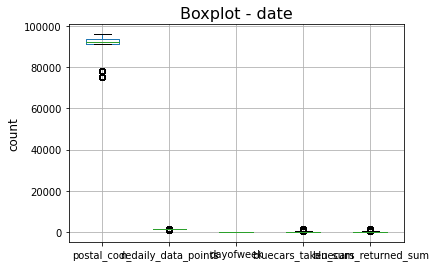

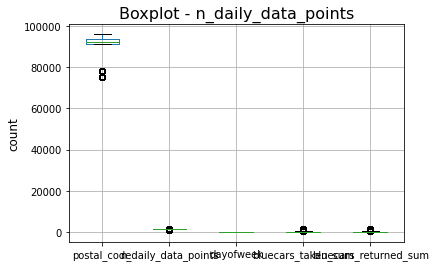

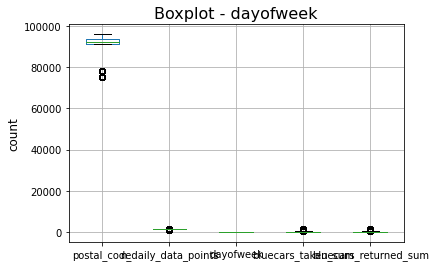

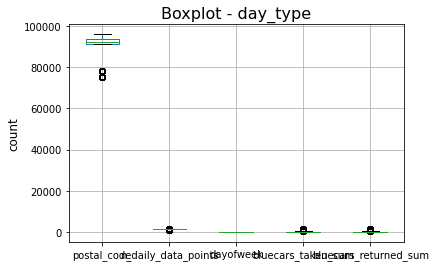

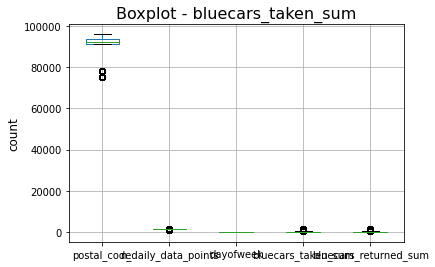

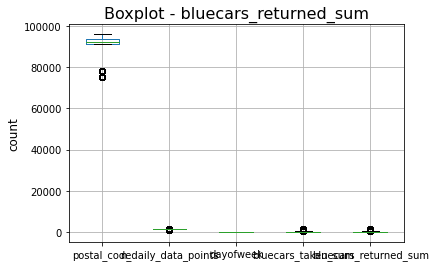

In [21]:
#Checking for Outliers
cols = ['date', 'n_daily_data_points', 'dayofweek', 'day_type',
       'bluecars_taken_sum', 'bluecars_returned_sum']

for column in cols:
    plt.figure()
    df.boxplot()
    plt.ylabel('count', fontsize = 12, rotation = 90)
    plt.title('Boxplot - {}'.format(column), fontsize = 16)

In [22]:
#dealing with outliers as this will distort the mean

Q1 = df.quantile(0.25) 
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [23]:
df.shape

(10024, 7)

The data now has no outliers.

In [24]:
#convert date column to datetime

df['date'] = pd.to_datetime(df['date'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [25]:
#Check if data was corrected
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10024 entries, 3899 to 16083
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   postal_code            10024 non-null  int64         
 1   date                   10024 non-null  datetime64[ns]
 2   n_daily_data_points    10024 non-null  int64         
 3   dayofweek              10024 non-null  int64         
 4   day_type               10024 non-null  object        
 5   bluecars_taken_sum     10024 non-null  int64         
 6   bluecars_returned_sum  10024 non-null  int64         
dtypes: datetime64[ns](1), int64(5), object(1)
memory usage: 626.5+ KB


from the output our data seems clean, no null values and no duplicates, no outliers and we have standard names for all columns

# **7. EXPORT CLEAN DATA**

In [26]:
#df = df.to_csv('.csv')

newdf = df.to_excel('autolib.xlsx')


# **8. DATA ANALYSIS**

In [27]:
#import clean data
df2 = pd.read_excel('/content/autolib.xlsx')
df2.head(3)

,Unnamed: 0,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum
0,3899,91330,2018-01-01,1440,0,weekday,19,9
1,3900,91330,2018-01-02,1438,1,weekday,10,10
2,3901,91330,2018-01-03,1439,2,weekday,11,13


In [163]:
df2.shape

(10024, 8)

### Sampling

In [94]:
# Creating a stratified random sample by grouping the dataset by weekday/ weekend
# Then extracting sample units from each group
# The sample size is calculated with 0.05 as the margin of error, and 95% as the confidence level 

df2_sample = df2.groupby('dayofweek', group_keys=False).apply(lambda x : x.sample(replace='False', frac=((10024/(1+10024*(0.05**2)))/10024)))

# Print the number of sample units from each day type
print(df2_sample['dayofweek'].value_counts())

# Display some of the sample data 
df2_sample

6    62
1    59
0    59
5    56
2    53
4    50
3    44
Name: dayofweek, dtype: int64


,Unnamed: 0,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum
7114,12594,93600,2018-04-09,1440,0,weekday,11,12
812,5024,92130,2018-02-05,1440,0,weekday,284,244
4480,9438,92500,2018-04-09,1440,0,weekday,114,117
2556,7133,92270,2018-04-30,1440,0,weekday,20,18
9783,15794,95870,2018-01-22,1440,0,weekday,12,17
...,...,...,...,...,...,...,...,...
4644,9638,92600,2018-06-03,1440,6,weekend,246,264
8742,14546,94300,2018-01-21,1440,6,weekend,84,94
5636,10827,93200,2018-04-29,1440,6,weekend,17,19
9594,15569,94800,2018-04-22,1440,6,weekend,79,92


In [30]:
df2_sample.columns

Index(['Unnamed: 0', 'postal_code', 'date', 'n_daily_data_points', 'dayofweek',
       'day_type', 'bluecars_taken_sum', 'bluecars_returned_sum'],
      dtype='object')

In [96]:
# Creating a subset with Monday sample data

day_sample =  df2_sample.loc[df2_sample['dayofweek']==0] # Monday is 0 according to the glossary

#Creating a subset with Friday sample data
end_sample =  df2_sample.loc[df2_sample['dayofweek']==4] # Since Monday 0, Friday will be 4

day_sample.head()
end_sample.head()

,Unnamed: 0,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum
9500,15456,94700,2018-06-15,1440,4,weekday,44,37
3992,8857,92390,2018-06-01,1440,4,weekday,10,6
5477,10632,93170,2018-02-16,1439,4,weekday,47,49
9824,15844,95870,2018-03-16,1440,4,weekday,19,11
837,5060,92130,2018-03-16,1440,4,weekday,254,263


## Exploratory Analysis

####Mode

In [97]:
day_sample.n_daily_data_points.mode()

0    1440
dtype: int64

In [98]:
end_sample.n_daily_data_points.mode()

0    1440
dtype: int64

In [99]:
day_sample.bluecars_taken_sum.mode()

0    7
dtype: int64

In [100]:
end_sample.bluecars_taken_sum.mode()

0     19
1    111
dtype: int64

In [36]:
day_sample.bluecars_returned_sum.mode()

0    18
dtype: int64

In [101]:
end_sample.bluecars_returned_sum.mode()

0    6
dtype: int64

1. Data points on Monday and Fridays are both 1440
2. Mostly, 0 bluecars were taken on Mondays
3. Mostly 19 or 111 bluecars were taken on Fridays
4. Mostly, 18 bluecars were returned on Mondays
5. Mostly, 6 bluecars were returned on Fridays

From the full sample the mot appearing records were:

In [38]:
modedf =pd.DataFrame()
modedf

data = {'Criteria': ['date', 'n_daily_data_points', 'dayofweek',
       'day_type', 'bluecars_taken_sum', 'bluecars_returned_sum'], 
       'The most appearing record': ['2018-03-08', '1440', '1 - Tuesday', 'weekday', '11', '24']} 
modedf =pd.DataFrame(data)
modedf



,Criteria,The most appearing record
0,date,2018-03-08
1,n_daily_data_points,1440
2,dayofweek,1 - Tuesday
3,day_type,weekday
4,bluecars_taken_sum,11
5,bluecars_returned_sum,24


####Mean

In [102]:
df2_sample.columns

Index(['Unnamed: 0', 'postal_code', 'date', 'n_daily_data_points', 'dayofweek',
       'day_type', 'bluecars_taken_sum', 'bluecars_returned_sum'],
      dtype='object')

In [103]:
day_sample.n_daily_data_points.mean()

1439.864406779661

In [104]:
end_sample.n_daily_data_points.mean()

1439.7

In [105]:
day_sample.bluecars_taken_sum.mean()

46.86440677966102

In [106]:
end_sample.bluecars_taken_sum.mean()

66.94

In [107]:
day_sample.bluecars_returned_sum.mean()

47.3728813559322

In [108]:
end_sample.bluecars_returned_sum.mean()

65.48

1. **Average daily data points** on Mondays and Fridays were the same (rounded to nearest whole figure)

1440

2. **Average blue cars taken** (rounded to nearest whole figure)

Monday: 47

Friday: 67

3. **Average blue cars returned** (rounded to nearest whole figure)

Monday: 47

Friday: 66


For the full sample these were the averages

In [46]:
meandf =pd.DataFrame()
meandf

data = {'Criteria': ['date', 'n_daily_data_points', 'dayofweek',
       'day_type', 'bluecars_taken_sum', 'bluecars_returned_sum'], 
       'The average': ['Nan', '1439.716883116883', 'Nan', 'Nan', '45.84415584415584', '45.72987012987013']} 
meandf =pd.DataFrame(data)
meandf

,Criteria,The average
0,date,Nan
1,n_daily_data_points,1439.716883116883
2,dayofweek,Nan
3,day_type,Nan
4,bluecars_taken_sum,45.84415584415584
5,bluecars_returned_sum,45.72987012987013


####Skew

In [109]:

day_sample['bluecars_taken_sum'].skew()

2.5510711661391694

In [110]:
end_sample['bluecars_taken_sum'].skew()

1.539396494432987

In [111]:
day_sample['bluecars_returned_sum'].skew()

2.1803668628445787

In [112]:
end_sample['bluecars_returned_sum'].skew()

1.5788221683262673

This shows us that the mode is below the median and average value for all these occurences

1. The number of Bluecars taken and that returned seems to have a relationship. 
2. Both distributions on Monday and Friday (Bluecars taken and Bluecars returned) are highly skewed to the left.

For the full sample these were the skewness

In [113]:
df2_sample.bluecars_taken_sum.skew()

1.782534950253462

In [114]:
df2_sample.bluecars_returned_sum.skew()

1.750850712268168

The skew on cars taken and returnes is similar. showing the correlation


####Kurtosis

In [115]:
day_sample['bluecars_taken_sum'].kurt()

7.998694062698847

In [116]:
end_sample['bluecars_taken_sum'].kurt()

2.4315286891311283

In [117]:
day_sample['bluecars_returned_sum'].kurt()

5.371626160522858

In [118]:
end_sample['bluecars_returned_sum'].kurt()

2.615853733762904

Positive values of kurtosis indicate that a distribution is peaked and possess thick tails. This data shows we have a leptokutic curve.
1. Especially on Mondays - Number of cars being returned is high
2. There is a correlation between Monday cars taken and cars returned.
3. There is a correlation between Friday cars taken and cars returned.


For the full sample size:

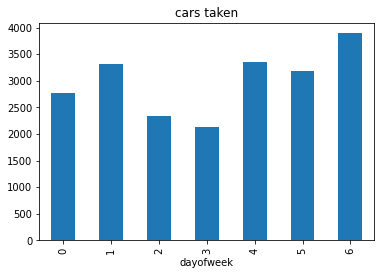

In [144]:
df2_sample.groupby('dayofweek').bluecars_taken_sum.sum().plot(title = 'cars taken', kind = 'bar')

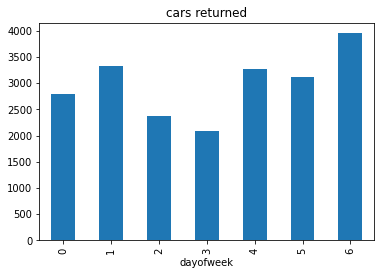

In [143]:
df2_sample.groupby('dayofweek').bluecars_returned_sum.sum().plot(title = 'cars returned', kind = 'bar')

In [120]:
df2_sample.bluecars_taken_sum.kurt()

3.3777257446554976

In [121]:
df2_sample.bluecars_returned_sum.kurt()

3.208520686758781

For the full sample cars taken and cars returned both have positive kurtotis. This shows a leptokurtic curve.



####Variance

In [151]:
day_sample['bluecars_taken_sum'].var()

2645.774400935126

In [152]:
end_sample['bluecars_taken_sum'].var()

4529.894285714286

In [153]:
day_sample['bluecars_returned_sum'].var()

2361.306838106369

In [154]:
end_sample['bluecars_returned_sum'].var()

4354.581224489796


The correlation between taken and returned bluecars on Monday is still visible

The correlation between taken and returned bluecars on Friday is still visible


For the full sample:

In [155]:
df2_sample.bluecars_taken_sum.var()

2961.394898363701

In [156]:
df2_sample.bluecars_returned_sum.var()

2860.8216614492876

Correlation is visible

####Describe

The description shows an increase in the total number of vehicles taken on Friday as compared to Monday

#####Blue cars taken

In [157]:
day_sample.bluecars_taken_sum.describe()

count     59.000000
mean      46.864407
std       51.437092
min        1.000000
25%       17.000000
50%       31.000000
75%       55.500000
max      284.000000
Name: bluecars_taken_sum, dtype: float64

In [158]:
end_sample.bluecars_taken_sum.describe()


count     50.000000
mean      66.940000
std       67.304489
min        3.000000
25%       18.250000
50%       43.500000
75%      110.500000
max      302.000000
Name: bluecars_taken_sum, dtype: float64

In [159]:
df2_sample.bluecars_taken_sum.describe()

count    383.000000
mean      54.765013
std       54.418700
min        0.000000
25%       17.500000
50%       36.000000
75%       76.500000
max      302.000000
Name: bluecars_taken_sum, dtype: float64

Mean of cars taken on:

Monday: 46

Friday: 66

Total Sample: 55

#####Blue cars returned

The description shows an increase in the total number of vehicles returned on Monday as compared to Friday

In [164]:
day_sample.bluecars_returned_sum.describe()

count     59.000000
mean      47.372881
std       48.593280
min        2.000000
25%       17.500000
50%       31.000000
75%       56.500000
max      244.000000
Name: bluecars_returned_sum, dtype: float64

In [165]:
end_sample.bluecars_returned_sum.describe()

count     50.000000
mean      65.480000
std       65.989251
min        3.000000
25%       16.250000
50%       40.500000
75%      100.250000
max      292.000000
Name: bluecars_returned_sum, dtype: float64

In [166]:
df2_sample.bluecars_returned_sum.describe()

count    383.000000
mean      54.660574
std       53.486649
min        2.000000
25%       17.000000
50%       37.000000
75%       77.500000
max      292.000000
Name: bluecars_returned_sum, dtype: float64

Mean of cars returned on:

Monday: 47

Friday: 65

Total Sample: 55

###Visual Representations

####Mondays

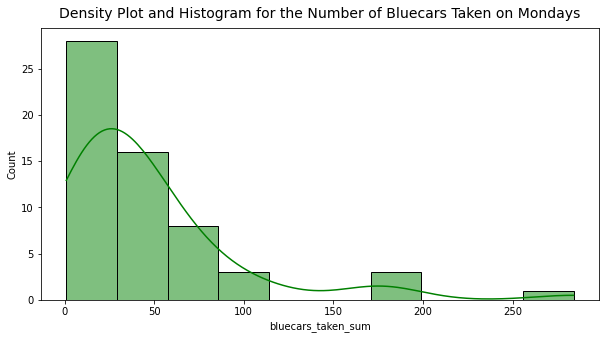

In [193]:
# Specifying the size of the graph
fig, ax = plt.subplots(figsize=(10,5))

# Ploting density plot and histogram of the number of cars taken on Monday
sns.histplot(day_sample['bluecars_taken_sum'], kde=True, stat="count",color='Green', bins=10)

# Label the graph
plt.title('Density Plot and Histogram for the Number of Bluecars Taken on Mondays', fontsize=14, y=1.015)

plt.show()

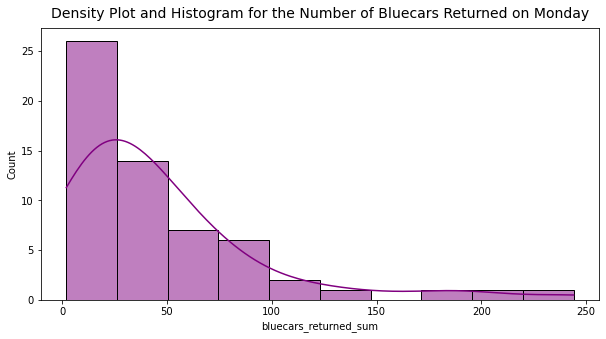

In [194]:
# Specifying the size of the graph
fig, ax = plt.subplots(figsize=(10,5))

# Ploting density plot and histogram of the number of cars taken from station with postal code 75015
sns.histplot(day_sample['bluecars_returned_sum'], kde=True, stat="count",color='purple', bins=10)

# Label the graph
plt.title('Density Plot and Histogram for the Number of Bluecars Returned on Monday', fontsize=14, y=1.015)

plt.show()

This goes to show that more vehicles are returned than taken on Mondays

####Fridays

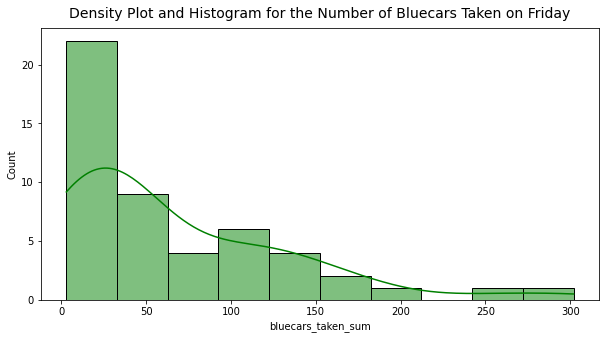

In [190]:
# Specifying the size of the graph
fig, ax = plt.subplots(figsize=(10,5))

# Ploting density plot and histogram of the number of cars taken from station with postal code 75015
sns.histplot(end_sample['bluecars_taken_sum'], kde=True, stat="count",color='green', bins=10)

# Label the graph
plt.title('Density Plot and Histogram for the Number of Bluecars Taken on Friday', fontsize=14, y=1.015)

plt.show()

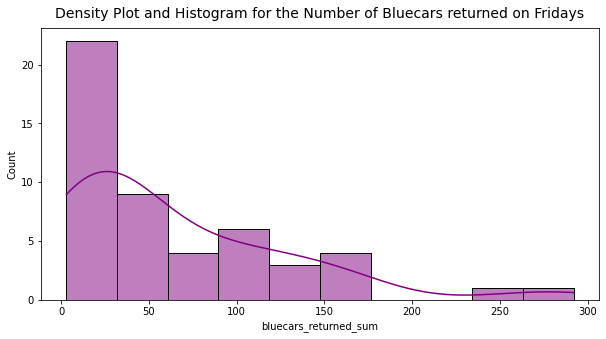

In [192]:
# Specifying the size of the graph
fig, ax = plt.subplots(figsize=(10,5))

# Ploting density plot and histogram of the number of cars taken from station with postal code 75015
sns.histplot(end_sample['bluecars_returned_sum'], kde=True, stat="count",color='purple', bins=10)

# Label the graph
plt.title('Density Plot and Histogram for the Number of Bluecars returned on Fridays', fontsize=14, y=1.015)

plt.show()

# **9. HYPOTHESIS TESTING**

In [ ]:
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  
from pandas_profiling import ProfileReport

import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

In [196]:
profile = ProfileReport(day_sample, title='Pandas Profiling Report - Mondays', explorative=True)
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:410: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [197]:
profile = ProfileReport(end_sample, title='Pandas Profiling Report - Fridays', explorative=True)
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:410: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

There is a clear correlation between blue cars taken and blue cars returned both on the weekend and weekdays

In [228]:
## Check the equality of the variances between the two groups using Levene's test

stat,p = stats.levene(day_sample['bluecars_taken_sum'], end_sample['bluecars_taken_sum'], center='mean') 
# we use center = mean because our samples are fairly/moderately skewed

print('Statistic=%.4f, pvalue=%.4f' % (stat, p))
print('\n')
# Interpretation of the Levene's test results

alpha = 0.05
if p <= alpha:
	print('The two variances are significantly different')
else:
	print('The two variances are approximately equal')
print('\n')
print('\n')
# calculate the means

# a) of the bluecars taken on monday dataframe

day_mean = day_sample['bluecars_taken_sum'].mean()

print('The mean of the Monday bluecars rented out data sample is: ', day_mean)
print('\n')
print('\n')
# b) of the bluecars taken on Friday dataframe

end_mean = end_sample['bluecars_taken_sum'].mean()

print('The mean of the Friday bluecars rented out data sample is: ', end_mean)
print('\n')
print('\n')
# calculate the standard deviation:

# a) of the bluecars taken on monday dataframe

day_std = day_sample['bluecars_taken_sum'].std()

print('The standard deviation of the Monday bluecars rented out data sample is: ', day_std)
print('\n')
print('\n')
# b) of the bluecars taken on friday dataframe

end_std = end_sample['bluecars_taken_sum'].std()

print('The standard deviation of the Friday bluecars rented out data sample is: ', end_std)
print('\n')
print('\n')
# calculate the standard error (se = std / sqrt(n)):

# a) of the bluecars taken on monday dataframe

day_std_error = day_std/ len(day_sample)

print('The standard error of the Monday bluecars rented out data sample is: ', day_std_error)
print('\n')
print('\n')
# b) of the bluecars taken on friday dataframe

end_std_error = end_std/ len(end_sample)

print('The standard error of the Friday bluecars rented out data sample is ', end_std_error)
print('\n')
print('\n')

difference = sqrt((day_std_error**2) + (end_std_error**2))

print("the standard error of the difference between the means is:",difference)
print('\n')
print('\n')

#find the T statistic

t_statistic = (day_mean - end_mean)/difference


print("The T statistic is",t_statistic)
print('\n')
print('\n')


# find the critical value

c_value = t.ppf(1.0 - alpha, freedom)

c_value
print("the Critical value is", c_value)
print('\n')
print('\n')

Statistic=6.5002, pvalue=0.0122


The two variances are significantly different




The mean of the Monday bluecars rented out data sample is:  46.86440677966102




The mean of the Friday bluecars rented out data sample is:  66.94




The standard deviation of the Monday bluecars rented out data sample is:  51.437091684261524




The standard deviation of the Friday bluecars rented out data sample is:  67.30448934294269




The standard error of the Monday bluecars rented out data sample is:  0.8718151132925682




The standard error of the Friday bluecars rented out data sample is  1.3460897868588537




the standard error of the difference between the means is: 1.6037516347773577




The T statistic is -12.517894158297144




the Critical value is 1.6592193118671417






In [229]:

if abs(t_statistic) <= c_value:
	print('Accept null hypothesis that the means are equal. There is no difference between the cars taken on Monday and those taken on Friday.')
else:
	print('Reject the null hypothesis. There is a difference between the average cars taken on monday and those taken on Friday.')

Reject the null hypothesis. There is a difference between the average cars taken on monday and those taken on Friday.


##Conclusion

Null hypothesis: There is no difference between the average number of Bluecars taken from stations on Mondays and the average number of Bluecars taken from stations on Fridays

Alternative hypothesis: There is a difference between the average number of Bluecars taken from stations on Mondays and the average number of Bluecars taken from station on Fridays

Keys

$H_{0}$ = Null hypothesis

$H_{1}$ = Alternative hypothesis

$mu_{1}$ = Average number of Bluecars taken from stations on Mondays

$mu_{2}$ = Average number of Bluecars taken from stations on Fridays

$H_{0}$: $mu_{1}$ = $mu_{2}$


$H_{1}$: $mu_{1}$ ≠ $mu_{2}$

we compare the t-statistic to the critical value of t (which can be found in the table using degrees of freedom and the pre-selected level of significance, α - 0.05). If the absolute value of the calculated t-statistic is larger than the critical value of t, we reject the null hypothesis.

In this case, our t statistic is - 12 and our critical value is 1.659.

Therefore T - statistic is less than critical value

This leads us to conclude; **The null hypothesis to be rejected**.

##THEREFORE $H_{1}$: $mu_{1}$ ≠ $mu_{2}$ is the correct conclusion

There is a significant difference in the average cars rented on Friday as compared to Monday. There being more cars rented on Friday as compared to Monday

**Other conclusions**

1. More cars are rented out on Friday as compared to Monday
2. More cars are returned on Monday as compared to Friday
3. There is a consumer base that rents out the vehicles daily and a consumer base that rents out the bluecars through the weekend - This can be seen by the close correlation between the daily blue cars taken vs blue cars returned graphs above
4. It can be assumed that there is more demand for the blue cars on weekends - Peak usage is on weekends